### Notebook for the GRN inference on Healthy - CTRL using `cellroacle`

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230323

### Import required libraries

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

import celloracle as co
co.__version__

INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Supplemental/NISC18030.ttf: In FT2Font: Could not set the fontsize (invalid pixel size; error code 0x17)
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Apple Color Emoji.ttc: In FT2Font: Could not set the fontsize (invalid pixel size; error code 0x17)
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/LastResort.otf: tuple indices must be integers or slices, not str


'0.12.0'

In [2]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok = True)

- Set up working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
Bio                 1.81
PIL                 9.2.0
appdirs             1.4.4
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
biothings_client    0.3.0
brotli              NA
celloracle          0.12.0
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
diskcache           5.4.0
executing           1.2.0
filelock            3.10.2
genomepy            0.15.0
gimmemotifs         0.17.0
goatools            1.3.1
google              NA
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.5
iter

In [4]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

### Load datasets

In [5]:
BrEpit_ALL = sc.read_h5ad('../data/Marburg_All_ctl230321_leiden_states.raw.h5ad') 
BrEpit_ALL

AnnData object with n_obs × n_vars = 115102 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_cou

In [6]:
print(f"Cell number is :{BrEpit_ALL.shape[0]}")
print(f"Gene number is :{BrEpit_ALL.shape[1]}")

Cell number is :115102
Gene number is :27208


### Subset condition of interest

In [7]:
BrEpit_ALL.obs['group'].value_counts()

copd_ctrl       30609
copd_iav        29157
healthy_ctrl    28175
healthy_iav     27161
Name: group, dtype: int64

In [8]:
adata = BrEpit_ALL[BrEpit_ALL.obs['group'].isin(['healthy_ctrl'])]
adata

View of AnnData object with n_obs × n_vars = 28175 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout

In [9]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :28175
Gene number is :27208


In [10]:
print(f"Cell number is :{adata.shape[0]}")

Cell number is :28175


### Reduce the inference workload by select HVGs

In [11]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)

adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 28175 × 3000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_count

### Load base GRN

In [12]:
peaks = pd.read_parquet("Epithelial_lung_base_GRN_dataframe.parquet")
peaks.head()

,peak_id,gene_short_name,9430076C15Rik,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,Znf431,Zscan10,Zscan26,Zscan4,arnt,cMyc,cebpa,nMyc,p53,p63
0,chr10_100346875_100347053,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100346947_100347161,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100347087_100347438,SCD,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100372680_100372946,OLMALINC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_101130776_101130905,TLX1NB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Make Oracle object

In [13]:
oracle = co.Oracle()

In [14]:
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states']
Dimensional reduction:  ['X_scANVI', 'X_scVI', 'X_umap']


In [15]:
oracle.import_anndata_as_raw_count(adata = adata,
                                   cluster_column_name = "leiden_states",
                                   embedding_name = "X_scANVI")

In [16]:
oracle.import_TF_data(TF_info_matrix = peaks)

### KNN imputation

In [17]:
oracle.perform_PCA()

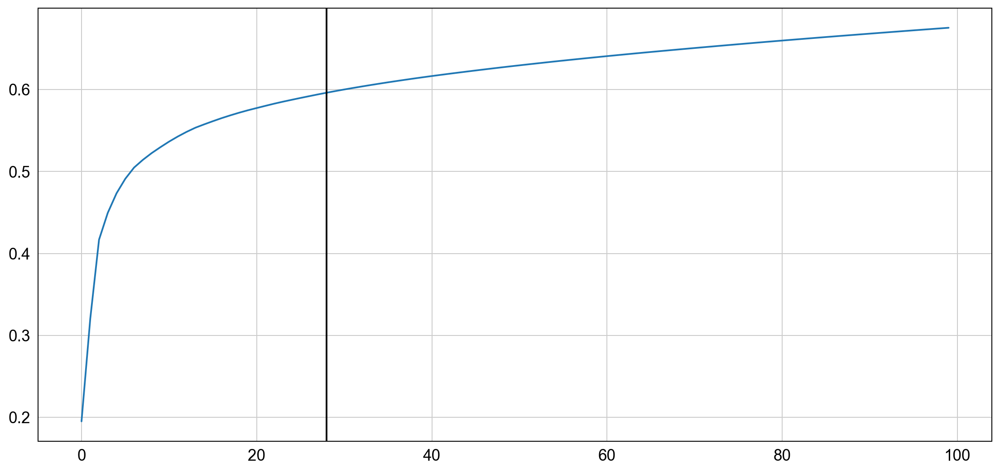

28


In [18]:
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c = "k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

- Estimate the optimal number of nearest neighbors for KNN imputation.

In [19]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :28175


In [20]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :704


In [21]:
oracle.knn_imputation(n_pca_dims = n_comps, k = k, balanced = True, b_sight = k*8,
                      b_maxl = k*4, n_jobs = 4)

-  Save and Load

### GRN calculation

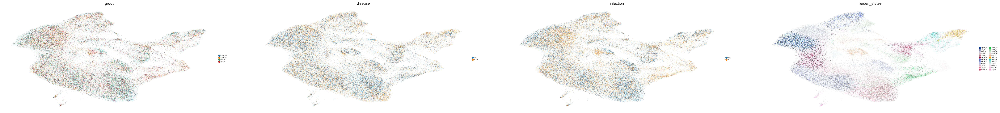

In [22]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['group', 'disease', 'infection', 'leiden_states'], size = 1, legend_fontsize = 5, ncols = 4)

In [23]:
%%time
links = oracle.get_links(cluster_name_for_GRN_unit = "leiden_states", alpha = 10,
                         verbose_level = 10)

  0%|          | 0/24 [00:00<?, ?it/s]

Inferring GRN for Basal_16...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Basal_2...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Basal_22...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Club_1...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Club_10...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Club_20...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Club_23...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Club_9...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_11...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_12...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_13...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_21...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_3...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_4...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for Goblet_8...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for MultiC_17...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for MultiC_18...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for MultiC_19...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_0...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_14...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_15...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_5...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_6...


  0%|          | 0/427 [00:00<?, ?it/s]

Inferring GRN for SupraB_7...


  0%|          | 0/427 [00:00<?, ?it/s]

CPU times: user 2min 49s, sys: 9.01 s, total: 2min 58s
Wall time: 4min 38s


In [24]:
links.links_dict.keys()

dict_keys(['Basal_16', 'Basal_2', 'Basal_22', 'Club_1', 'Club_10', 'Club_20', 'Club_23', 'Club_9', 'Goblet_11', 'Goblet_12', 'Goblet_13', 'Goblet_21', 'Goblet_3', 'Goblet_4', 'Goblet_8', 'MultiC_17', 'MultiC_18', 'MultiC_19', 'SupraB_0', 'SupraB_14', 'SupraB_15', 'SupraB_5', 'SupraB_6', 'SupraB_7'])

In [25]:
links.links_dict["Goblet_11"]

,source,target,coef_mean,coef_abs,p,-logp
0,BHLHE41,ABCB6,0.001211,0.001211,5.819103e-06,5.235144
1,NR4A3,ABCB6,0.000259,0.000259,5.145428e-05,4.288579
2,BHLHE41,ACKR3,0.102190,0.102190,5.003126e-09,8.300759
3,HEY1,ACKR3,0.045454,0.045454,6.073979e-05,4.216527
4,CREB3L1,ACKR3,-0.070485,0.070485,9.399184e-10,9.026910
...,...,...,...,...,...,...
2674,SNAI1,WDR11-AS1,-0.000944,0.000944,2.744619e-06,5.561518
2675,NHLH1,ZG16B,0.121584,0.121584,4.039158e-14,13.393709
2676,FOXJ1,ZNF114,0.000543,0.000543,9.692500e-09,8.013564
2677,FOXI1,ZNF114,0.000247,0.000247,1.158683e-05,4.936035


### Network preprocessing

In [26]:
links.filter_links(p = 0.001, weight = "coef_abs", threshold_number = 2000)

Basal_16


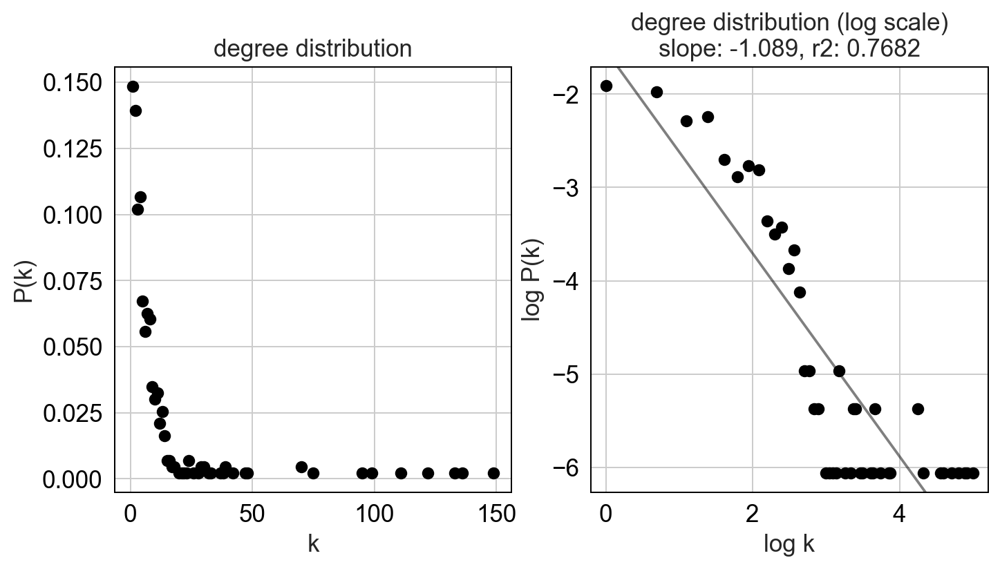

Basal_2


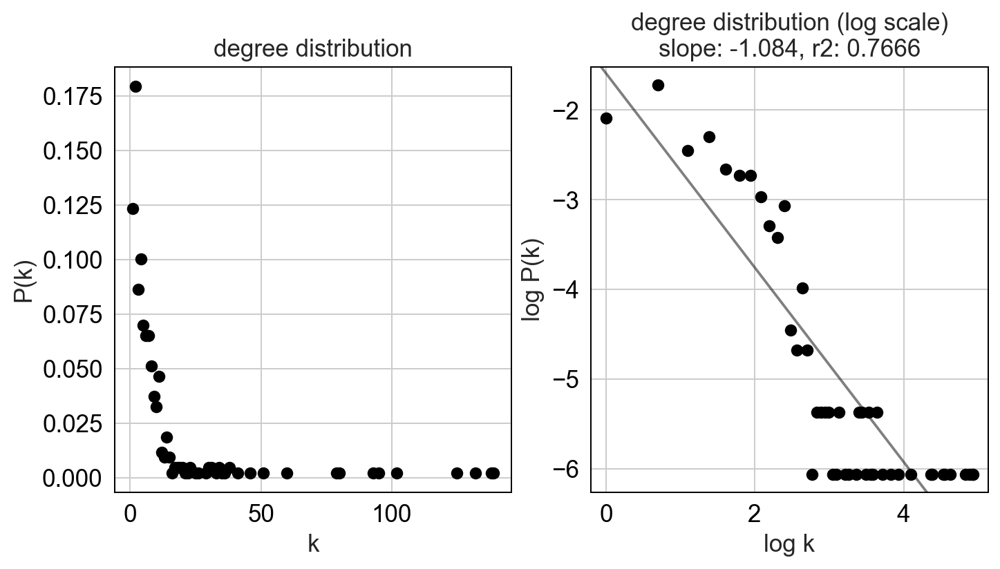

Basal_22


ValueError: Length mismatch: Expected axis has 1 elements, new values have 2 elements

In [27]:
plt.rcParams["figure.figsize"] = [9, 4.5]
links.plot_degree_distributions(plot_model = True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

### Calculate several network scores

In [28]:
links.get_network_score()
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
HEY1,122.0,0.283721,0.0,0.000000,122.0,0.283721,0.0,0.754981,Basal_16
PMEPA1,1.0,0.002326,1.0,0.002326,0.0,0.000000,0.0,0.466494,Basal_16
CREB3L1,29.0,0.067442,0.0,0.000000,29.0,0.067442,0.0,0.077164,Basal_16
SAA1,1.0,0.002326,1.0,0.002326,0.0,0.000000,0.0,0.035968,Basal_16
IRF1,133.0,0.309302,0.0,0.000000,133.0,0.309302,0.0,1.000000,Basal_16


In [29]:
links.cluster

['Basal_16',
 'Basal_2',
 'Basal_22',
 'Club_1',
 'Club_10',
 'Club_20',
 'Club_23',
 'Club_9',
 'Goblet_11',
 'Goblet_12',
 'Goblet_13',
 'Goblet_21',
 'Goblet_3',
 'Goblet_4',
 'Goblet_8',
 'MultiC_17',
 'MultiC_18',
 'MultiC_19',
 'SupraB_0',
 'SupraB_14',
 'SupraB_15',
 'SupraB_5',
 'SupraB_6',
 'SupraB_7']

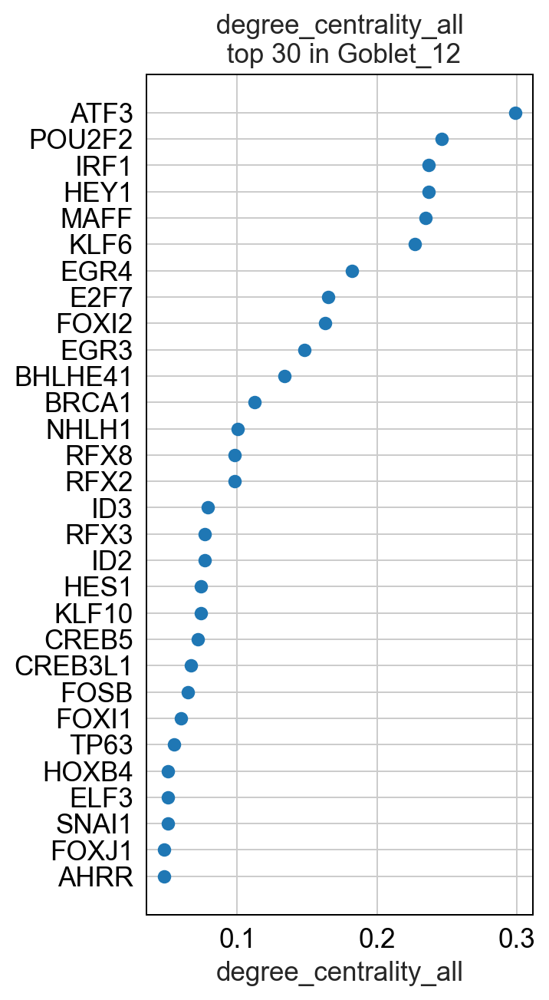

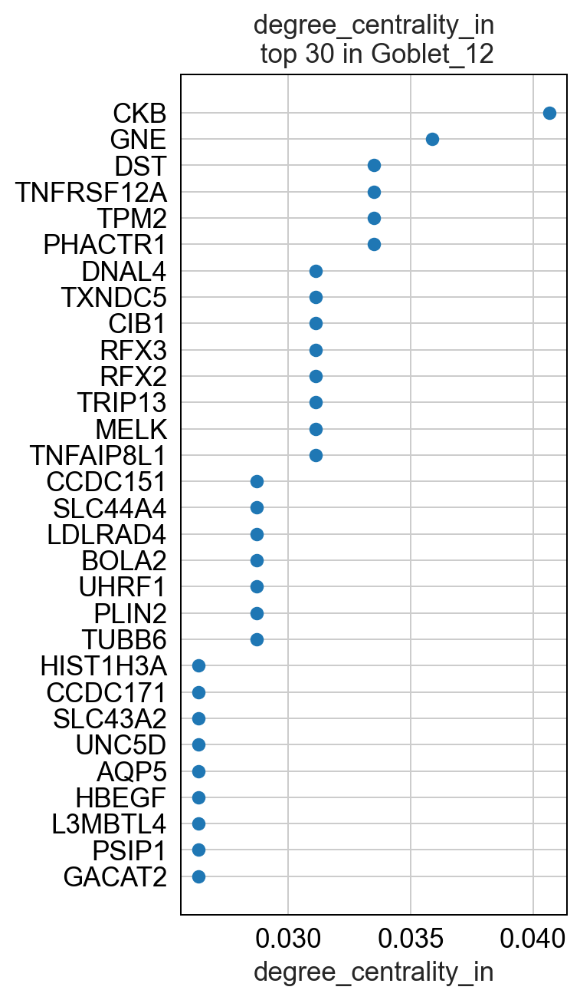

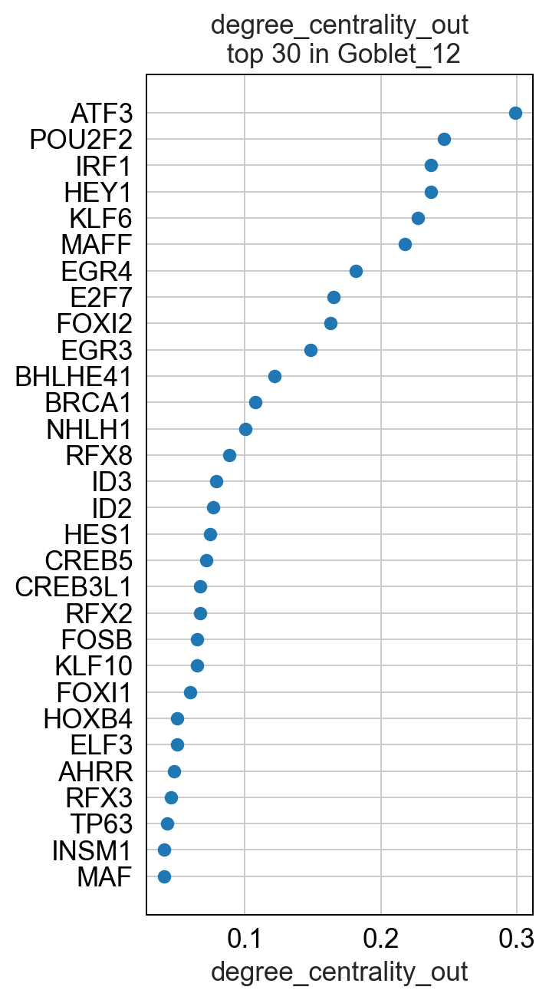

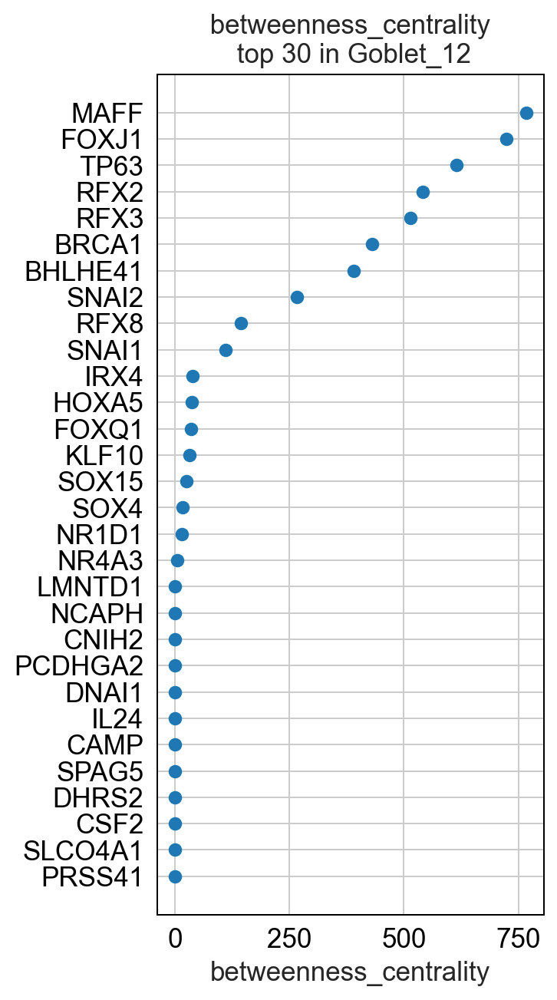

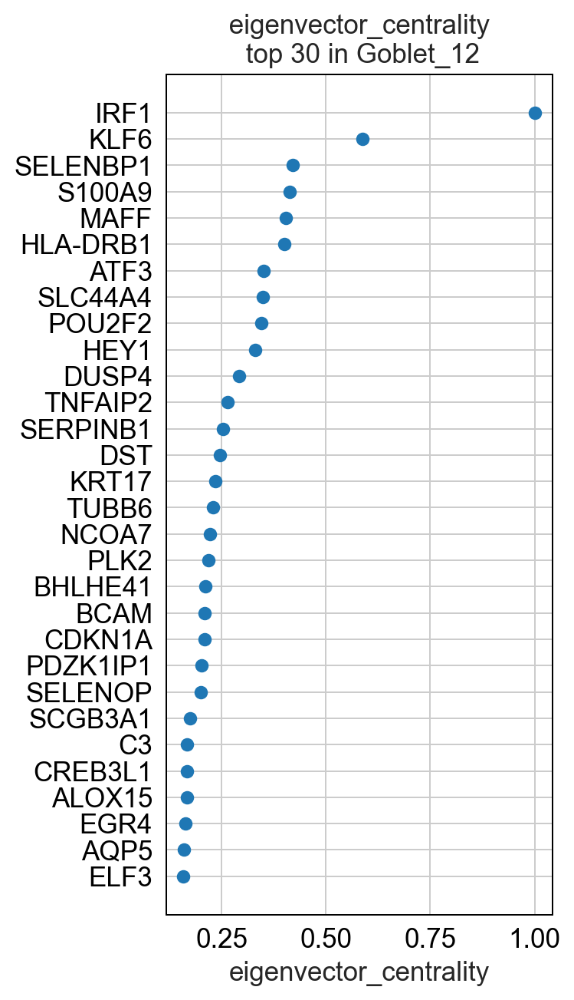

In [30]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Goblet_12", n_gene = 30, save = f"{save_folder}/Goblet_12_ranked_score")

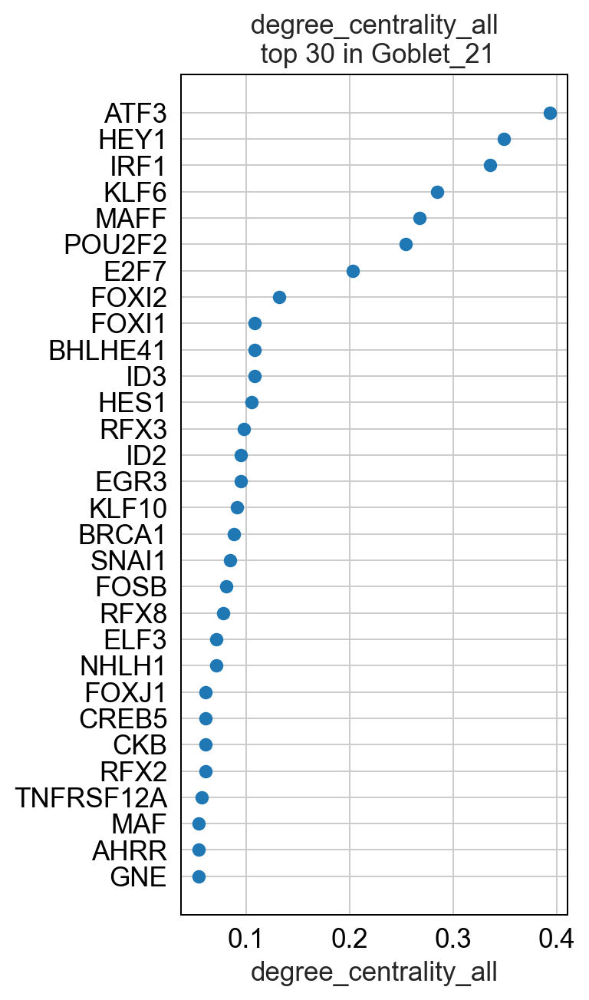

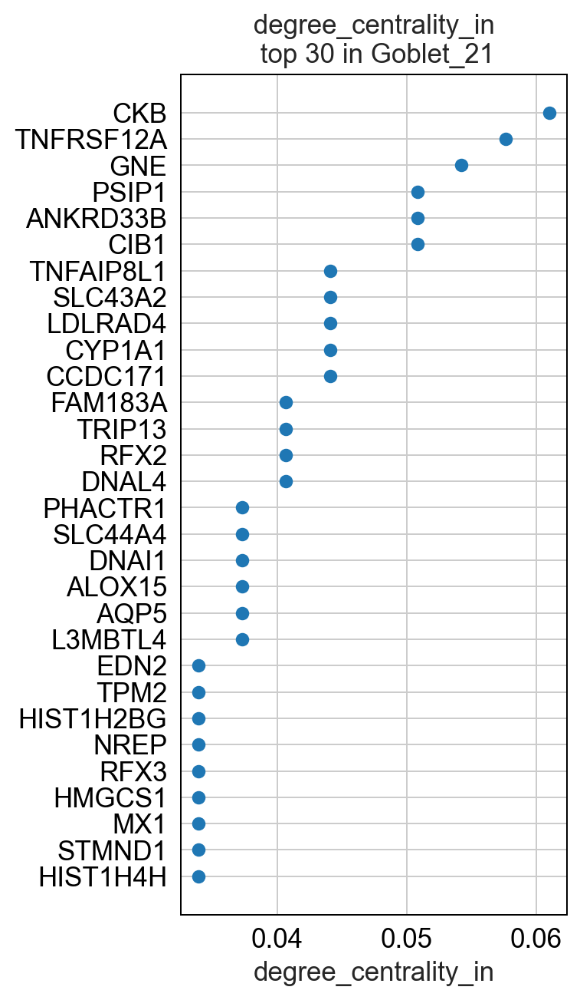

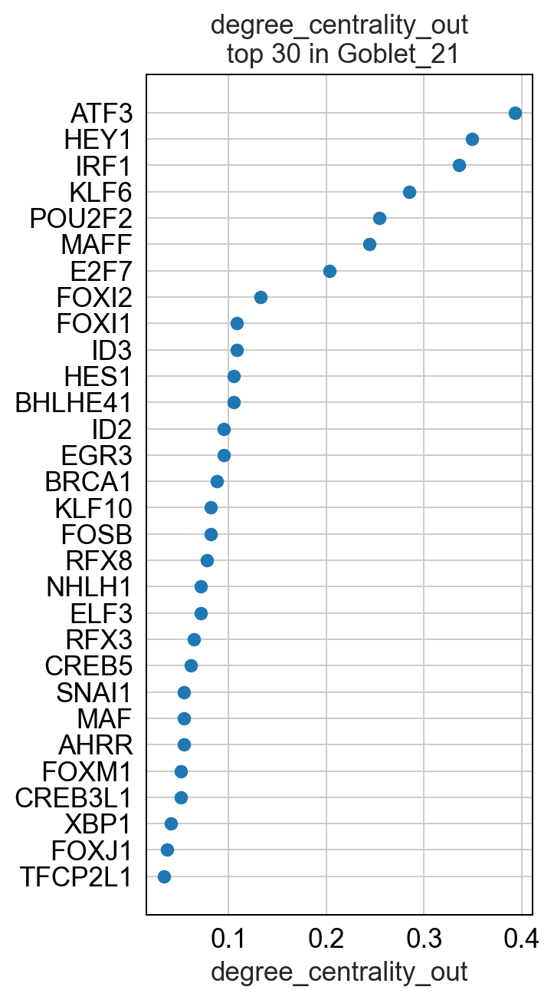

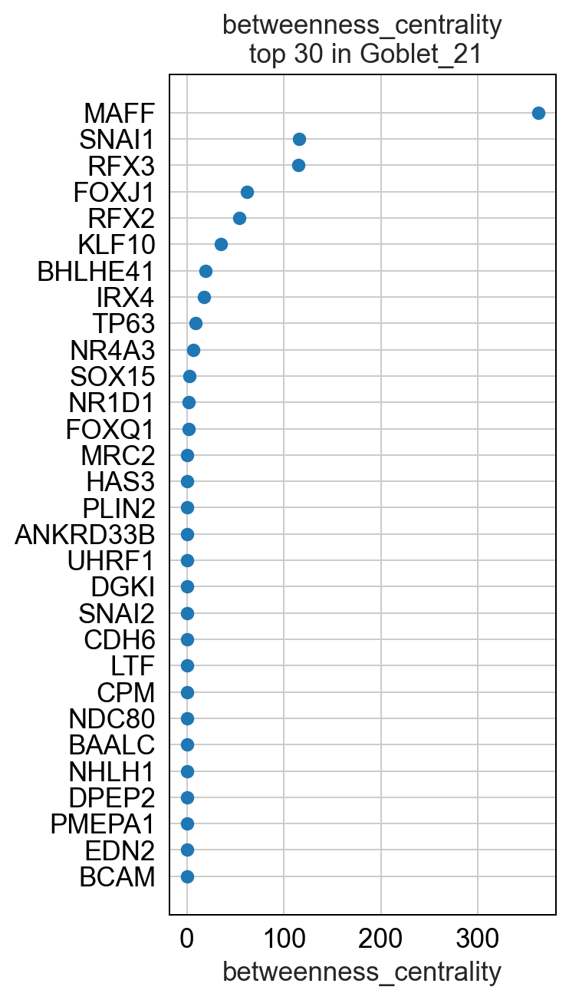

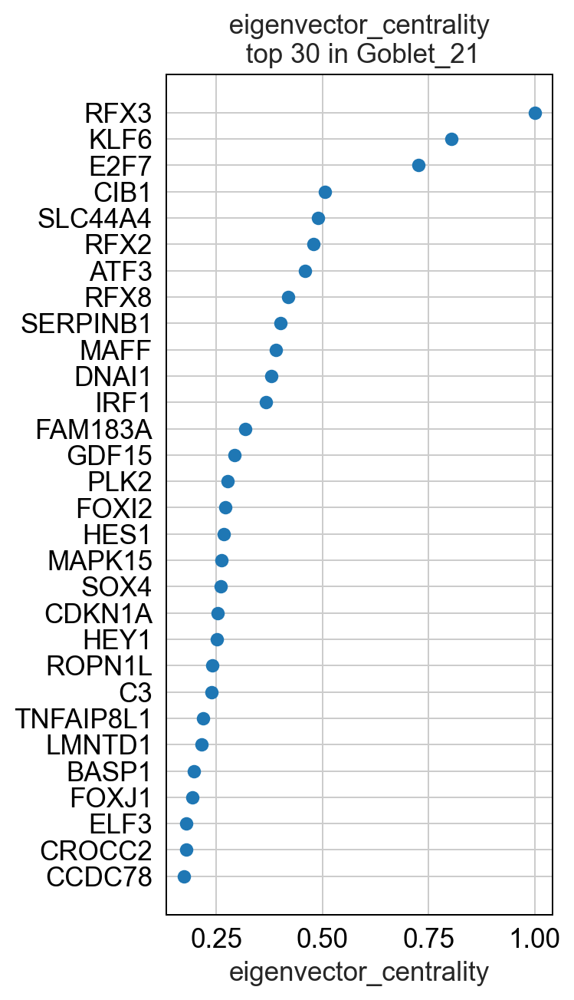

In [31]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Goblet_21", n_gene = 30, save = f"{save_folder}/Goblet_21_ranked_score")

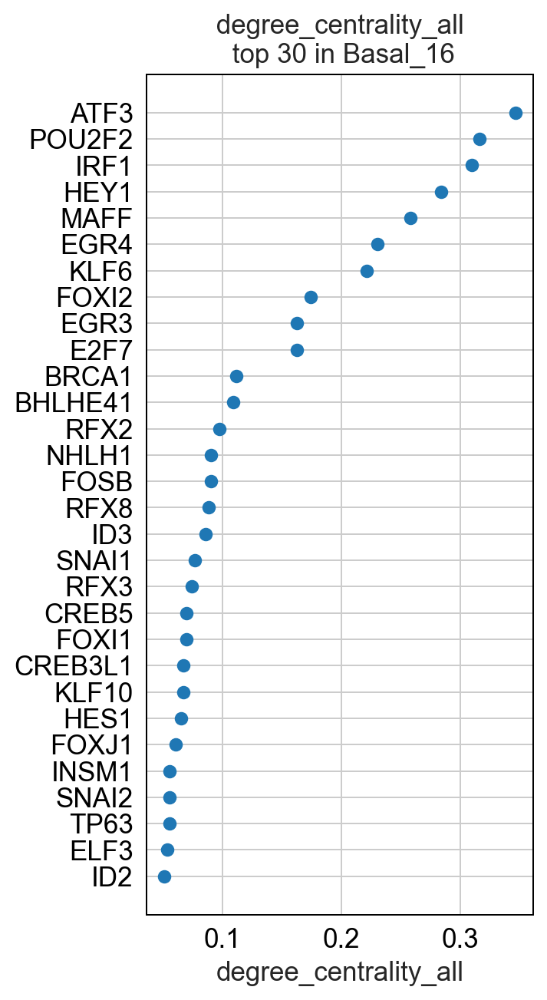

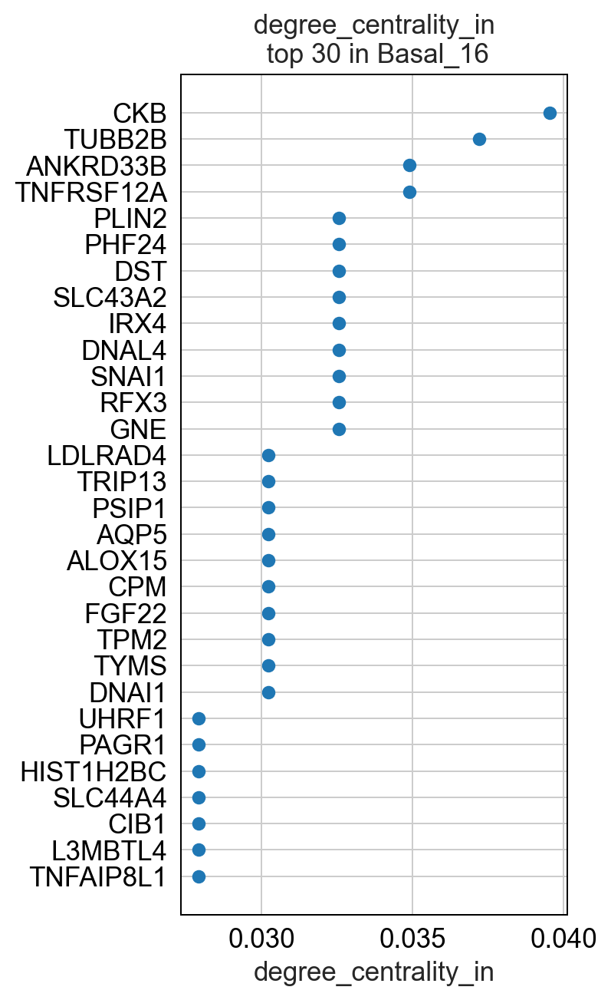

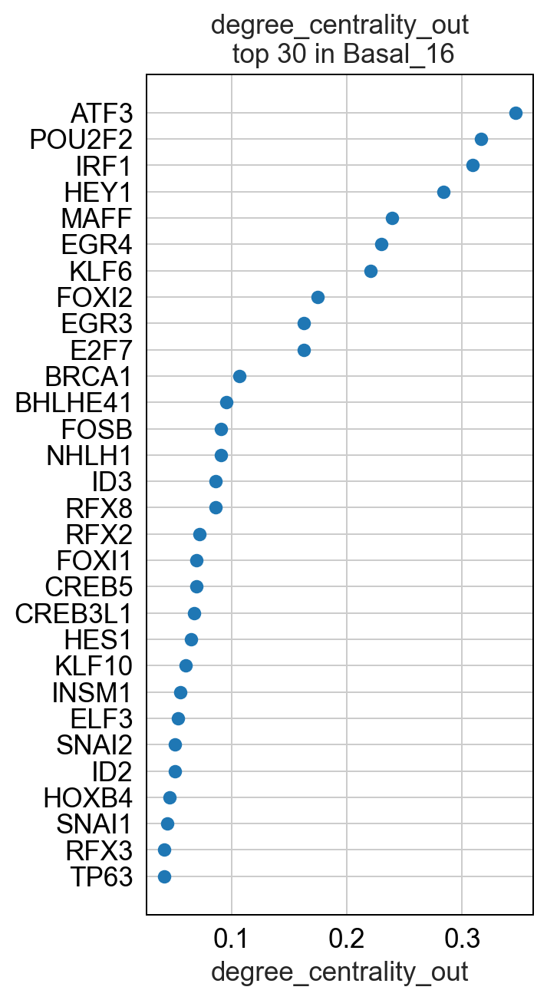

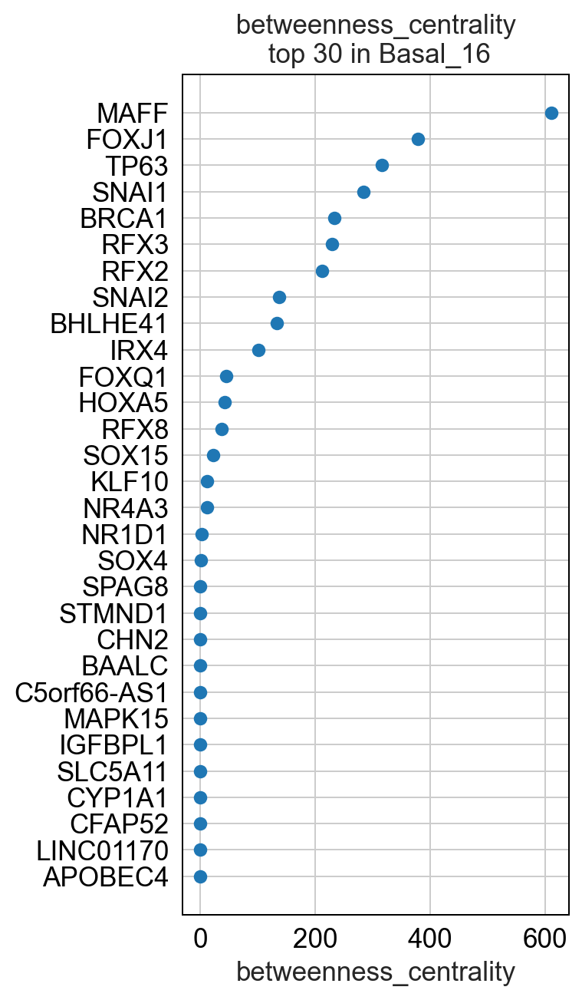

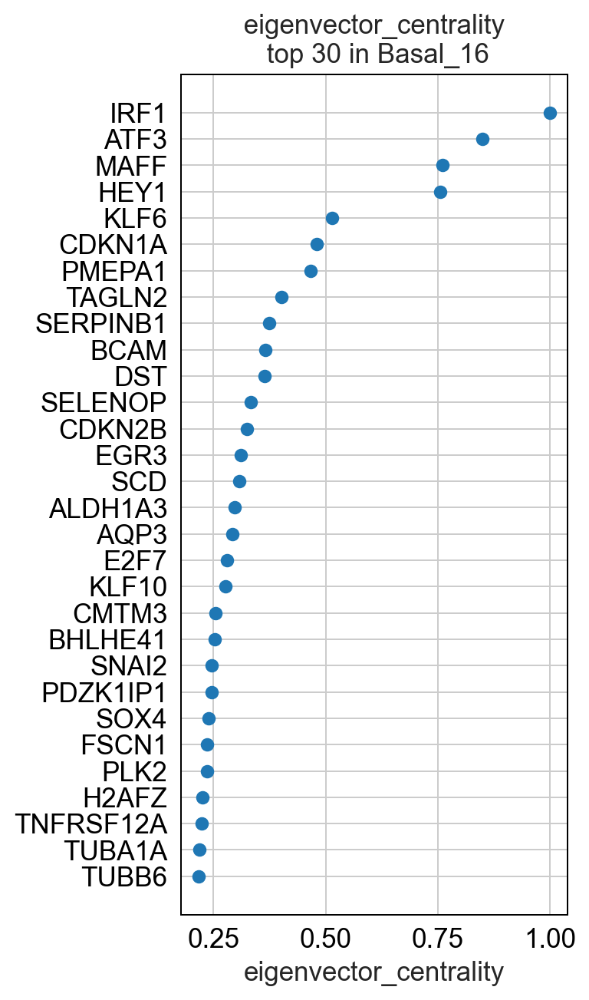

In [32]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Basal_16", n_gene = 30, save = f"{save_folder}/Basal_16_ranked_score")

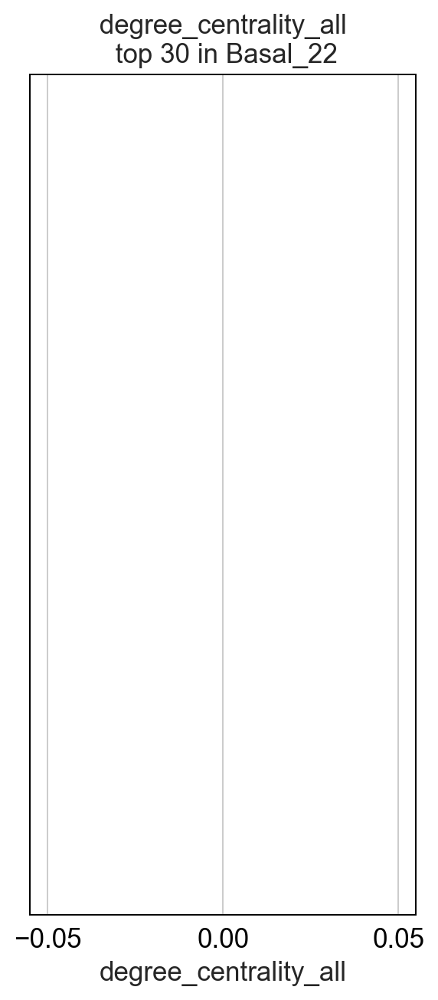

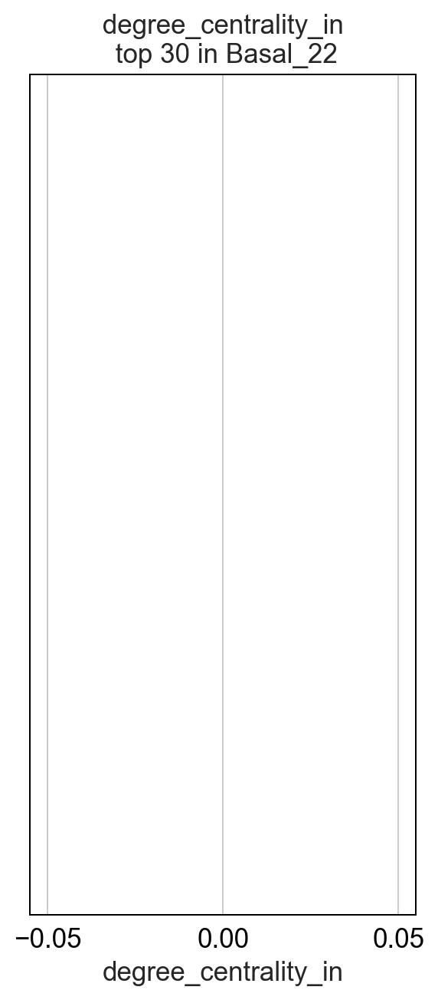

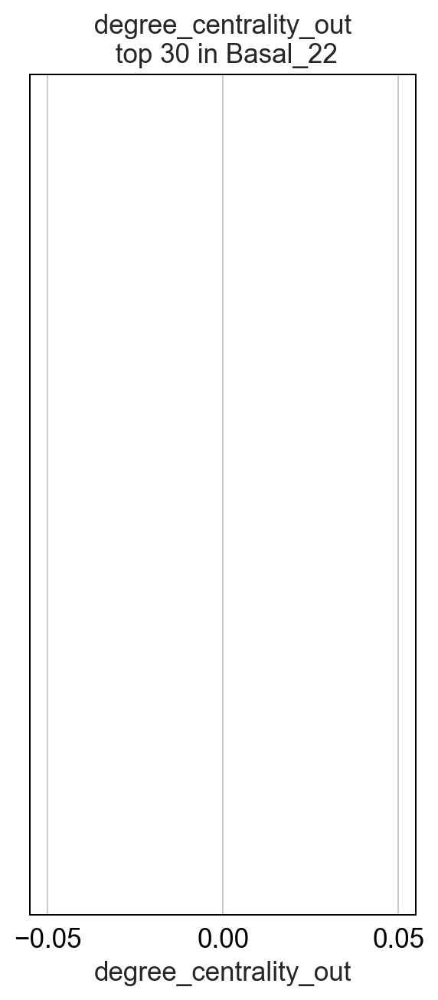

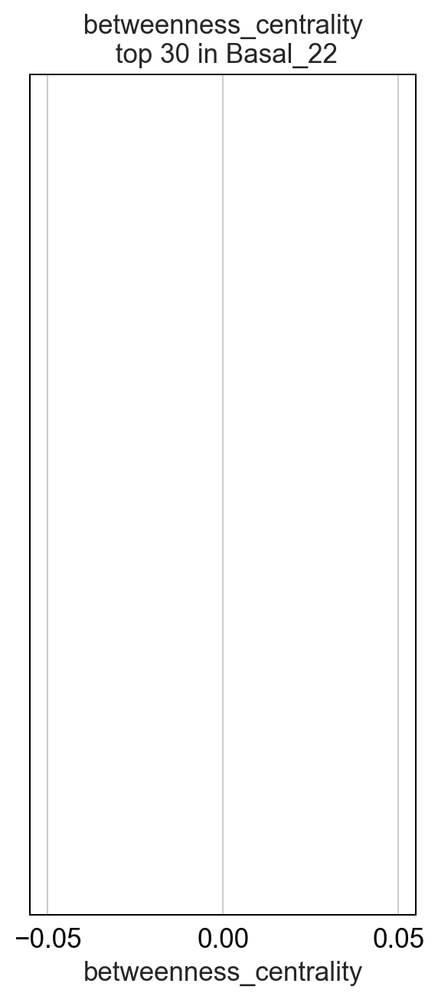

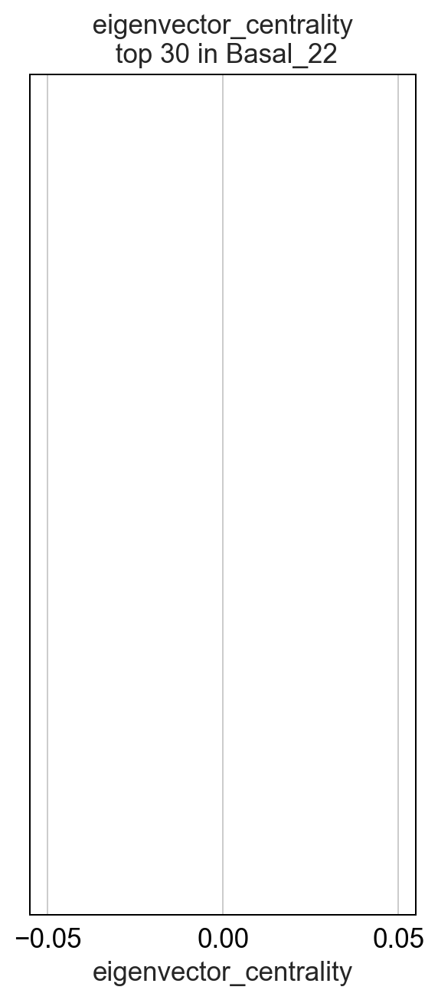

In [33]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Basal_22", n_gene = 30, save = f"{save_folder}/Basal_22_ranked_score")

### Compare GRN structur between clusters

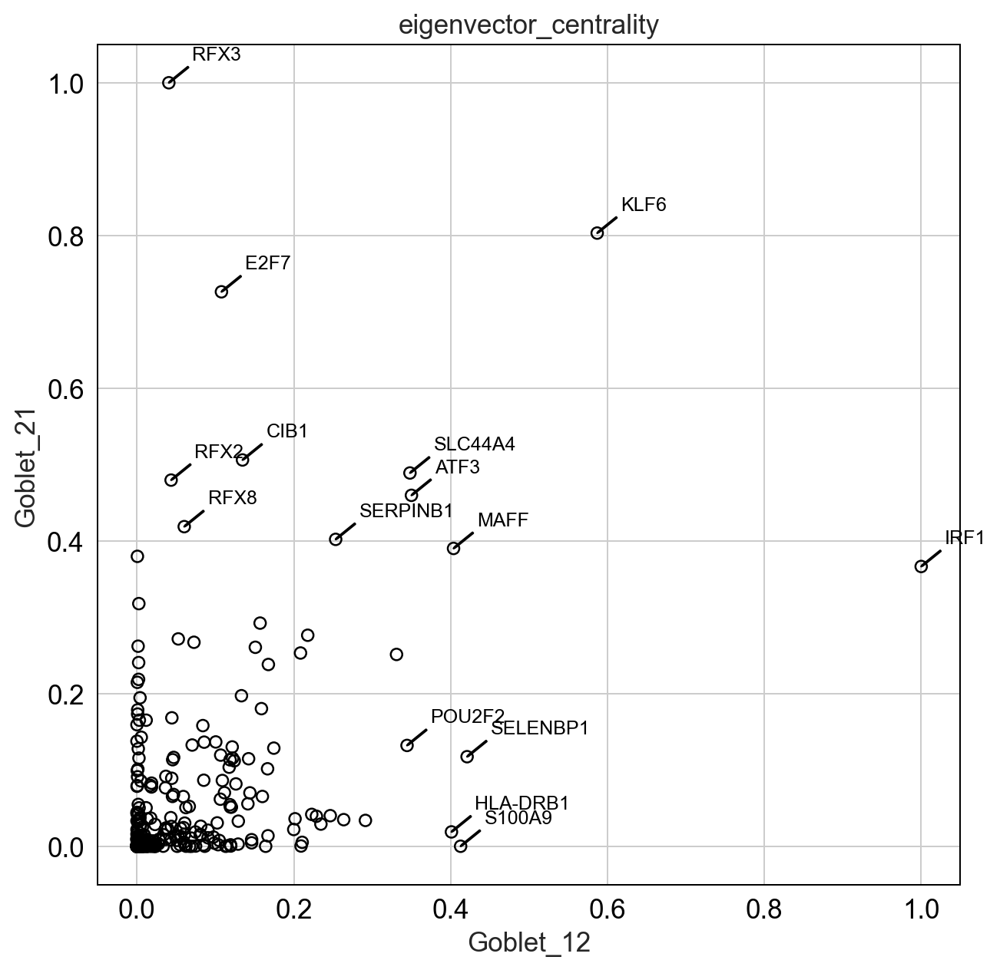

In [34]:
links.plot_score_comparison_2D(value = "eigenvector_centrality",
                               cluster1 = "Goblet_12", cluster2 = "Goblet_21",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

In [35]:
links.plot_score_comparison_2D(value = "eigenvector_centrality",
                               cluster1 = "Basal_16", cluster2 = "Basal_22",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

KeyError: 'Basal_22'

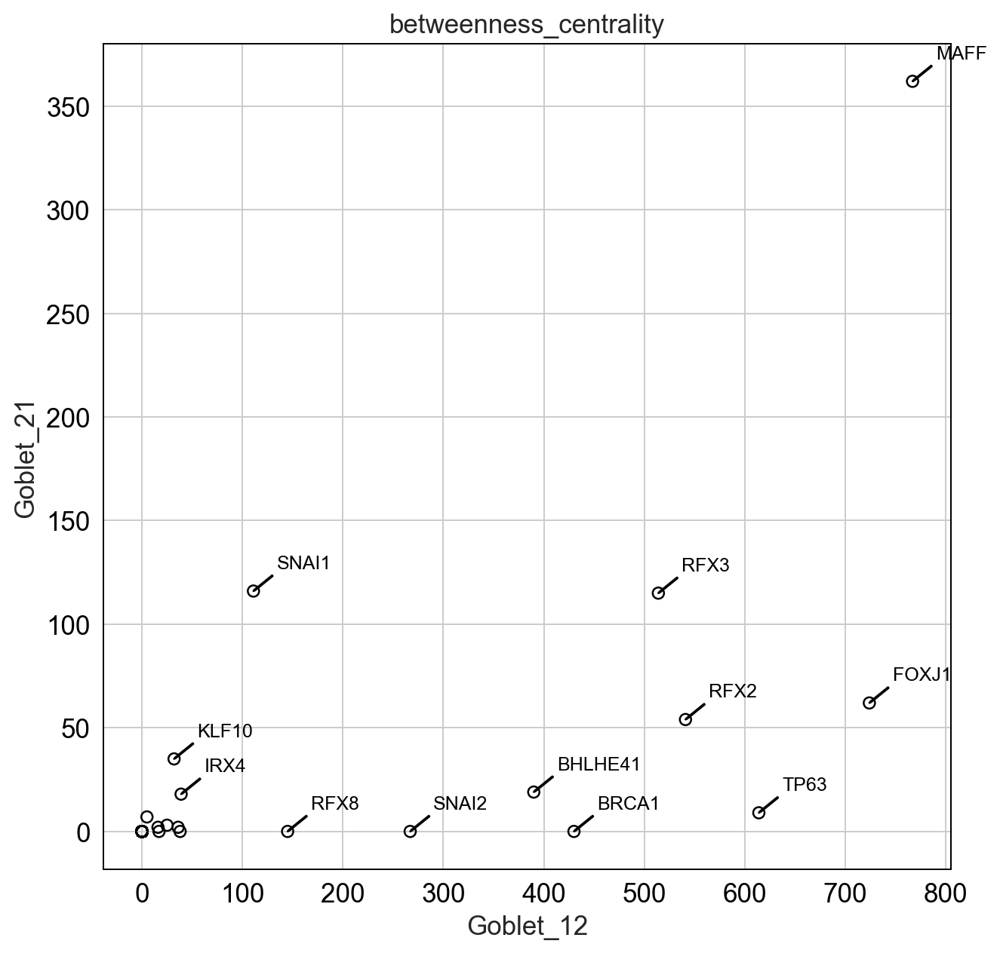

In [36]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Goblet_12", cluster2 = "Goblet_21",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

In [37]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Basal_16", cluster2 = "Basal_22",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

KeyError: 'Basal_22'

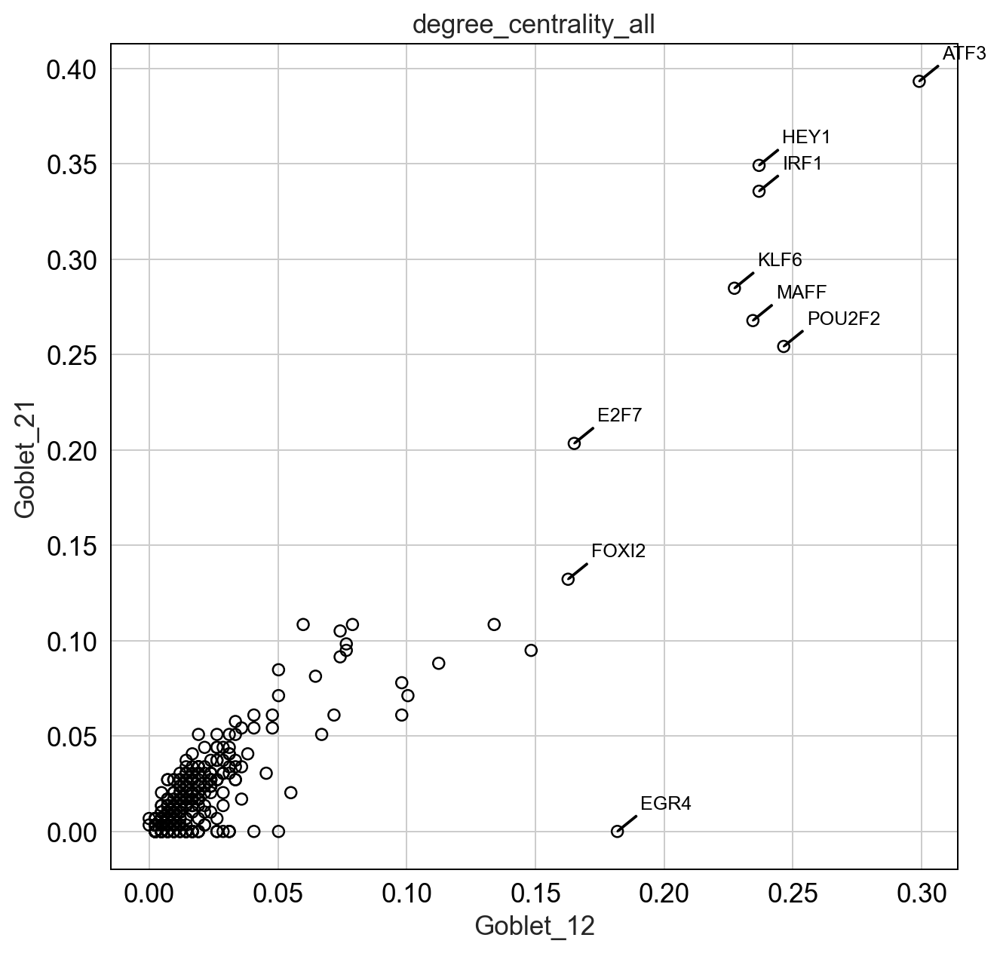

In [38]:
links.plot_score_comparison_2D(value = "degree_centrality_all",
                               cluster1 = "Goblet_12", cluster2 = "Goblet_21",
                               percentile = 98, save = f"{save_folder}/score_comparison")

In [39]:
links.plot_score_comparison_2D(value = "degree_centrality_all",
                               cluster1 = "Basal_16", cluster2 = "Basal_22",
                               percentile = 98, save = f"{save_folder}/score_comparison")

KeyError: 'Basal_22'

In [ ]:
links.plot_score_per_cluster(goi = "POU2F2", save = f"{save_folder}/network_score_per_gene/")

In [40]:
cluster_name = "Goblet_13"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

,source,target,coef_mean,coef_abs,p,-logp
2146,ELF3,SCGB3A1,2.234934,2.234934,5.200443e-15,14.283960
330,POU2F2,C3,-1.565113,1.565113,2.620450e-16,15.581624
2142,POU2F2,SCGB3A1,-1.496127,1.496127,3.061798e-08,7.514023
569,POU2F2,CLU,1.461182,1.461182,2.153746e-09,8.666806
2143,HEY1,SCGB3A1,-1.438888,1.438888,3.434962e-10,9.464078
